In [1]:
import random
from itertools import product
import numpy as np
from location.CModel import *
from location.PModel import *
import pandas as pd

In [2]:
num_points = 10
num_hubs = 3
PC, PT, PD = 1.0, 0.75, 1.25
w = np.random.randint(1, 100, size=(num_points, num_points))
x = random.sample(range(100), num_points)
y = random.sample(range(100), num_points)
A, X, Y, P = PHub(num_points=num_points,
           num_hubs=num_hubs,
           collect_cost=PC,
           transfer_cost=PT,
           distribution_cost=PD,
           x_lat=x,
           y_lon=y,
           cover=w,
           solver=SCIP_CMD()).prob_solve()

Status: Optimal
Selected hubs = [0, 4, 5]
Minimum total cost =  None
p-Hub 0:[0, 1, 2, 3, 6, 7, 8, 9]
p-Hub 4:[4]
p-Hub 5:[5]


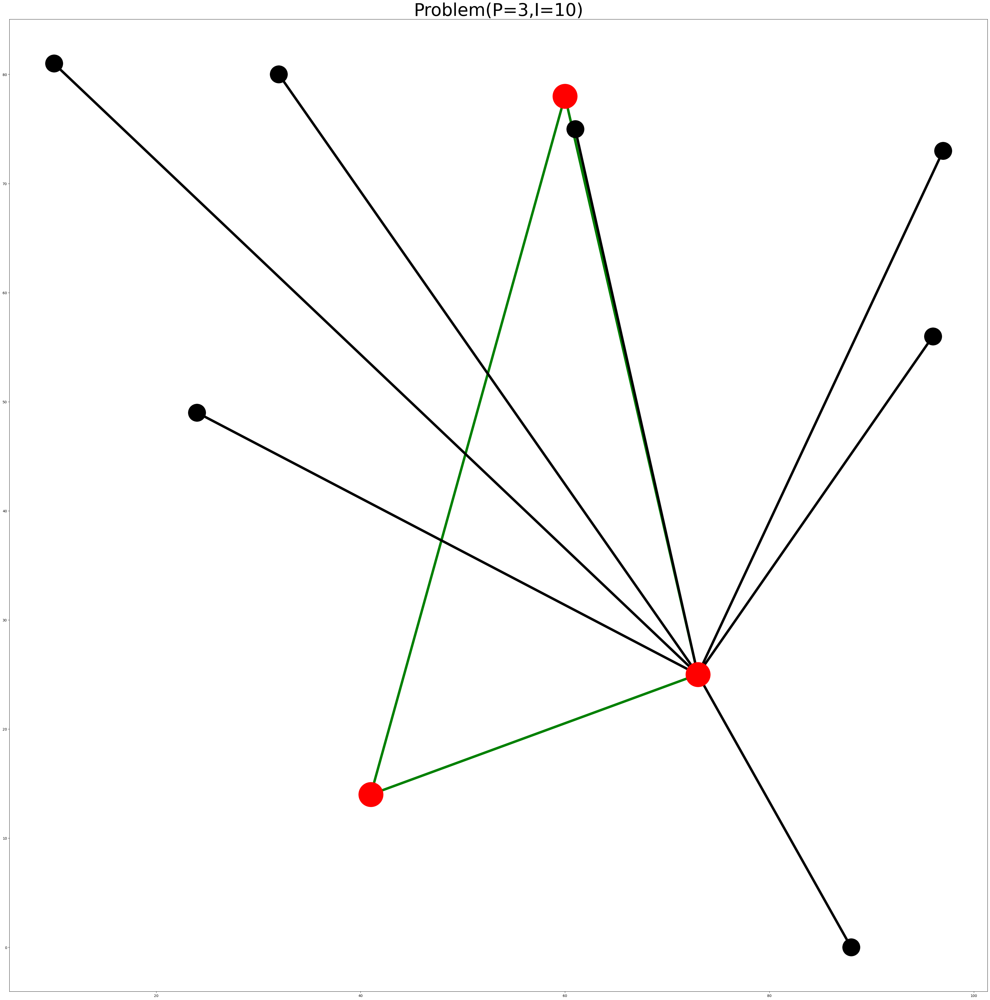

In [3]:
plt.figure(figsize=(50,50))
name = 'Problem(P=' + str(num_hubs) + ',I=' + str(num_points) + ')'
plt.title(name, fontsize = 50)
N = list(range(len(X)))
H = list(set(A))
for k1 in range(len(H)):
    for k2 in range(k1, len(H)):
        i = H[k1]
        j = H[k2]
        plt.plot([X[i], X[j]], [Y[i], Y[j]], color='g', linewidth=7)
for i in set(N) - set(H):
    plt.plot([X[i], X[A[i]]], [Y[i], Y[A[i]]], color='k', linewidth=7)
    plt.plot(X[i], Y[i], 'ko',zorder=2, markersize=50)
for i in H:
    plt.plot(X[i], Y[i], 'ro', markersize=70)
plt.show()

In [7]:
df = pd.read_csv('北京POI裁剪.csv',encoding='gbk')
df = df.query(' adname=="朝阳区"| adname=="东城区" ').reset_index(drop=True)
data = df[['long', 'lat']]
num_points = df.shape[0]
num_hubs = 9
PC, PT, PD = 1.0, 0.75, 1.25
from geopy.distance import distance
def distance_matrix():
    coords = df[['lat', 'long']].values
    matrix = []
    for i in range(len(coords)):
        row = []
        for j in range(len(coords)):
            if i == j:
                row.append(0.0)
            else:
                row.append(distance(coords[i], coords[j]).km)
        matrix.append(row)
    return np.array(matrix)
w = distance_matrix()
A, X, Y, selected = PHub(num_points=num_points,
           num_hubs=num_hubs,
           collect_cost=PC,
           transfer_cost=PT,
           distribution_cost=PD,
           x_lat=data['lat'],
           y_lon=data['long'],
           cover=w,
           solver=SCIP_CMD()).prob_solve()


Status: Optimal
Selected hubs = [0, 1, 10, 11, 12, 13, 14, 15, 16]
Minimum total cost =  None
p-Hub 0:[0, 2, 3, 4, 5, 6, 7, 8, 9, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
p-Hub 1:[1]
p-Hub 10:[10]
p-Hub 11:[11]
p-Hub 12:[12]
p-Hub 13:[13]
p-Hub 14:[14]
p-Hub 15:[15]
p-Hub 16:[16]


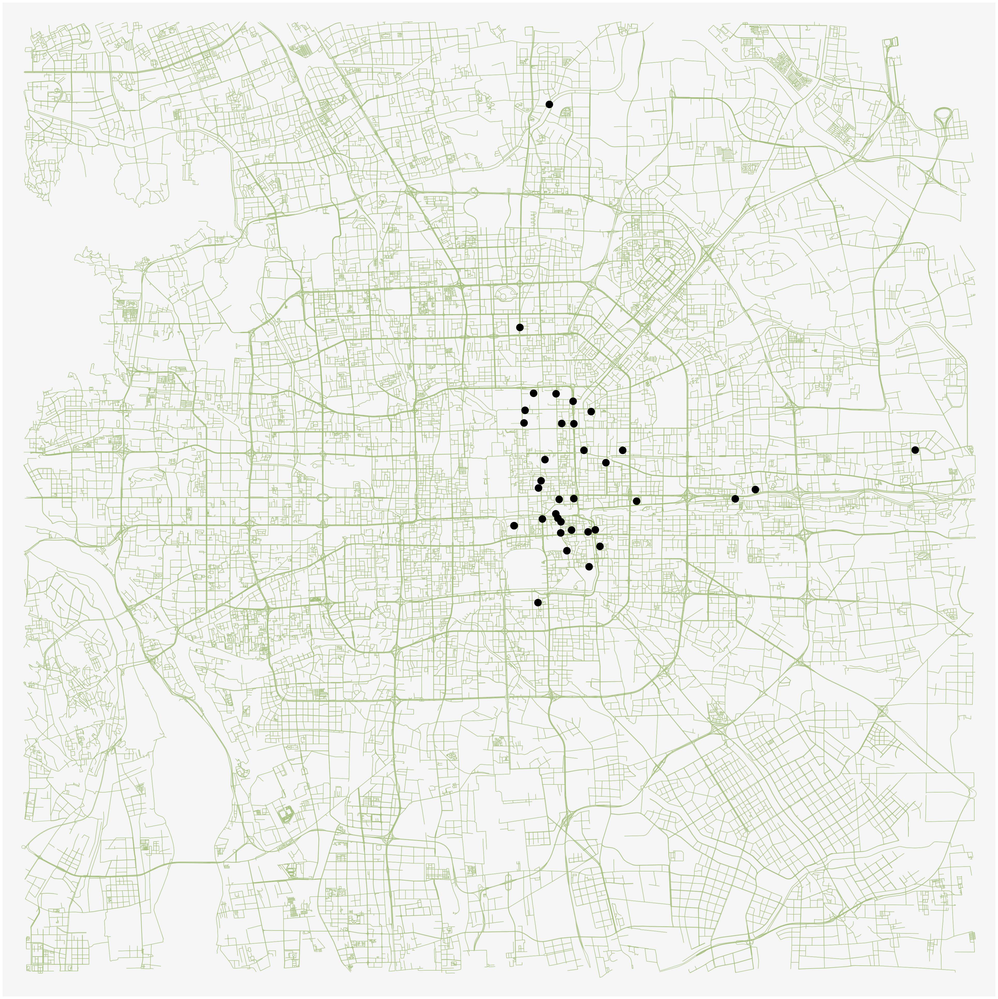

In [8]:
G = ox.graph_from_address('Beijing', dist=20000, network_type='drive')
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
for j in range(num_points):
    lx = df['lat'][j]
    ly = df['long'][j]
    plt.plot(ly,lx,c='black',marker='o',markersize=20)

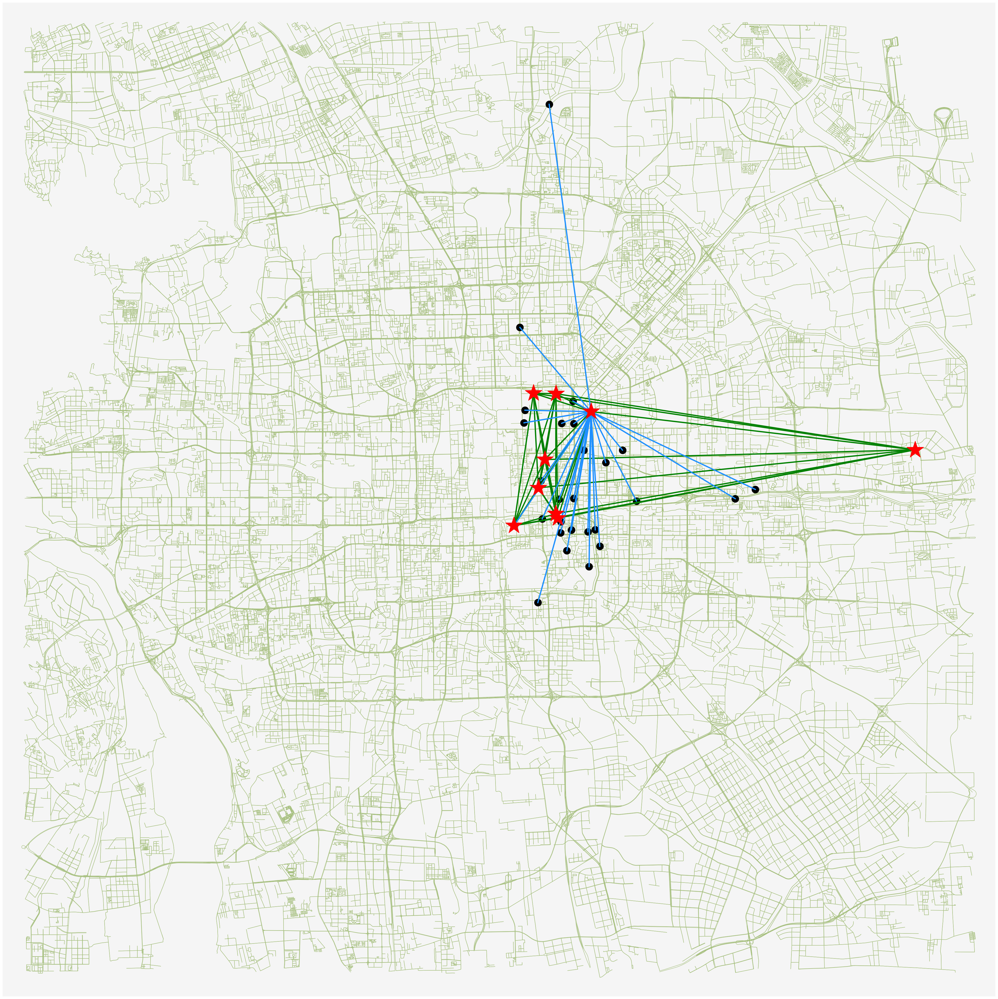

In [9]:
G = ox.graph_from_address('Beijing', dist=20000, network_type='drive')
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
for j in range(num_points):
    if j in selected:
        lx = df['lat'][j]
        ly = df['long'][j]
        plt.plot(ly,lx,c='red',marker='*',markersize=50, zorder=3)
    else:
        lx = df['lat'][j]
        ly = df['long'][j]
        plt.plot(ly,lx,c="black",marker='o',markersize=20, zorder=2)

N = list(range(len(X)))
H = list(set(A))
for k1 in range(len(H)):
    for k2 in range(k1, len(H)):
        i = H[k1]
        j = H[k2]
        plt.plot([Y[i], Y[j]], [X[i], X[j]], color='g', linewidth=3.5)
for i in set(N) - set(H):
    plt.plot([Y[i], Y[A[i]]], [X[i], X[A[i]]], color='#1E90FF', linewidth=3.5)